In [ ]:
from __future__ import print_function
%matplotlib inline

from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.utils import shuffle
import pandas as pd
import numpy as np
from collections import Counter
from PIL import Image as PImage
from os import listdir
from pickle import dump
import matplotlib.pyplot as plt
import PIL, cv2, os, json

import keras, h5py
import tensorflow as tf
from keras.datasets import mnist
from keras.models import Sequential, load_model
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from keras import backend as K
from keras.utils import to_categorical
from keras.backend.tensorflow_backend import set_session
from keras.callbacks import TensorBoard
from keras.applications.vgg16 import preprocess_input

### Set TF config 

 - mainly used to restrict memory usage

In [2]:
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.4
set_session(tf.Session(config=config))

In [3]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 997920304257358645
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 5525929984
locality {
  bus_id: 1
}
incarnation: 14292085106006804727
physical_device_desc: "device: 0, name: TITAN Xp, pci bus id: 0000:02:00.0, compute capability: 6.1"
]


## Image Training Data

In [2]:
#!gsutil -m rsync -d -r gs://pixrs-data/food /pixrs-data/food
    
!ls /pixrs-data/food/photo

env  food  menu  test


In [3]:
train_dir = '../pixrs-data/food/photo'

In [5]:
from IPython.display import Image
Image(os.path.join(train_dir, 'food/965.1196850648.jpg'))

NameError: name 'os' is not defined

### Train type define

In [7]:
m = {'food_img': 0,'food_menu': 1, 'food_env': 2}

### manipulate image

In [8]:
from imgaug import augmenters as iaa
import imgaug as ia

seq = iaa.Sequential([
                    iaa.Fliplr(0.5),               # 左右翻轉
                    iaa.Flipud(0.5),               # 上下翻轉
                    iaa.Affine(rotate=(-90, 90),   # 旋轉
                    scale=(0.6, 1.4),              # 縮放
                    mode = 'edge',                 # 影像翻轉造成區塊缺值的補值方式
                    translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)})]) # 平移
#img = seq.augment_image(img)

### Prepare training data

In [53]:
label =[]
images_flist = []
import os
for cate in m.keys():
    dc = os.path.join(train_dir, cate) 
    for fname in os.listdir(dc):
        fpath = os.path.join(dc, fname) 
        label.append(m[cate])
        images_flist.append(fpath)

X_imgf_train, X_imgf_test, y_imgf_train, y_imgf_test =  \
    train_test_split(images_flist, label, test_size=0.1, random_state=100)

In [54]:
total_images = len(label)
lc = Counter(label)

In [55]:
print('Total got %i images' % (total_images))

Total got 2455 images


### Read and resize image

In [56]:
def readImg(flist, labels, is_aug=False):
    images = []
    r_lable = []
    for fname, label in zip(flist, labels):
        img = cv2.imread(fname)
        if img is None:
            print(fname)
            continue
        else:
            height, width, channels = img.shape
        img = cv2.resize(img, (224, 224))
        images.append(img) 
        r_lable.append(label)     
        
        if is_aug == True:
            for _ in range(int(0.3*total_images/lc[label])):
                resized_image = seq.augment_image(img)
                images.append(resized_image) 
                r_lable.append(label)

    return (images,r_lable)

readImg([X_imgf_train[0]], [y_imgf_train[0]], is_aug=True)

([array([[[124, 124, 130],
          [124, 124, 130],
          [124, 124, 130],
          ..., 
          [161, 152, 149],
          [161, 152, 149],
          [161, 152, 149]],
  
         [[124, 124, 130],
          [124, 124, 130],
          [124, 124, 130],
          ..., 
          [162, 153, 150],
          [162, 153, 150],
          [162, 153, 150]],
  
         [[124, 124, 130],
          [124, 124, 130],
          [123, 123, 130],
          ..., 
          [162, 153, 150],
          [162, 153, 150],
          [162, 153, 150]],
  
         ..., 
         [[ 67,  94, 114],
          [ 70,  95, 115],
          [ 80, 102, 120],
          ..., 
          [ 97, 103, 121],
          [ 99, 106, 123],
          [111, 116, 131]],
  
         [[ 69,  97, 114],
          [ 71,  97, 113],
          [ 77,  99, 115],
          ..., 
          [ 97, 103, 122],
          [ 95, 102, 119],
          [100, 105, 120]],
  
         [[ 66,  95, 110],
          [ 74,  99, 115],
          [ 85, 107, 

In [57]:
X_img_train, y_img_train  = readImg(X_imgf_train, y_imgf_train, is_aug=True)
X_img_test, y_img_test    = readImg(X_imgf_test, y_imgf_test, is_aug=False)

../data/food/food_menu/224. w34_food_stand-introducing_menu_answer.gif
../data/food/food_img/.DS_Store
../data/food/food_env/.DS_Store
../data/food/food_env/422. anigif
../data/food/food_menu/.DS_Store
../data/food/food_menu/311. %e7%84%a1%e8%8f%b8%e5%81%a5%e5%ba%b7%e8%8f%9c%e5%96%ae.gif
../data/food/food_env/._1. caption.jpg
../data/food/food_menu/193. menu1.gif
../data/food/food_menu/87. menu2.gif
../data/food/food_env/._.DS_Store
../data/food/food_menu/._.DS_Store
../data/food/food_img/._.DS_Store


### Show all label count

In [58]:
Counter(y_img_train)

Counter({0: 693, 1: 810, 2: 695})

In [73]:
X_train = preprocess_input(np.array(X_img_train).astype(np.float32))
y_train_category = to_categorical(y_img_train)

X_test = preprocess_input(np.array(X_img_test).astype(np.float32))
y_test_category = to_categorical(y_img_test)

In [74]:
X_train.shape

(2198, 224, 224, 3)

### Start To Load Model

In [75]:
from keras.applications.vgg16 import VGG16
from keras.preprocessing.image import img_to_array, load_img
from keras.models import Model
from keras.layers import Input, Dense, Flatten, Conv2D, Dropout, BatchNormalization
from keras import regularizers
from keras.optimizers import Adam
from keras.losses import categorical_crossentropy

In [76]:
# load the model
base_model = VGG16()
# re-structure the model
base_model.layers.pop()
model = Model(inputs=base_model.inputs, outputs=[base_model.layers[-1].output])
# summarize
print(model.summary())
# extract features from each photo

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [77]:
X_pretrain_output = model.predict(X_train, verbose=0)
X_pretrain_output.dump("../model/X_pretrain_output.pk")

In [78]:
X_test_new = model.predict(X_test, verbose=0)

In [21]:
# plt.imshow(X_test_new[0][3])

### Transfer Learning Flow

In [79]:
newInput = Input(shape=[4096])
drop1    = Dropout(0.05)(newInput)
d1       = Dense(1024, activation='relu', kernel_regularizer=regularizers.l1(0.0003))(drop1)
b1       = BatchNormalization()(d1)
d2       = Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.0003))(b1)
output   = Dense(2, activation='softmax')(d2)
model_classify = Model(inputs=[newInput], outputs=[output])
model_classify.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         (None, 4096)              0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 4096)              0         
_________________________________________________________________
dense_10 (Dense)             (None, 1024)              4195328   
_________________________________________________________________
batch_normalization_4 (Batch (None, 1024)              4096      
_________________________________________________________________
dense_11 (Dense)             (None, 64)                65600     
_________________________________________________________________
dense_12 (Dense)             (None, 2)                 130       
Total params: 4,265,154
Trainable params: 4,263,106
Non-trainable params: 2,048
______________________________________________________________

In [80]:
model_classify.compile(optimizer=Adam(),
              loss=categorical_crossentropy, metrics=['acc',])

### Trainf mutiple binary classifier model

In [180]:
model_list = [None] * len(m.keys())

for classifier in m.keys():
    
    train_1 = np.array([X_pretrain_output[idx] for idx, y in enumerate(y_train_category[:, m[classifier]]) if y == 1])
    # neg_sample_size = round(len(train_1) / len(m.keys()) - 1)
    train_0 = np.array([X_pretrain_output[idx] for idx, y in enumerate(y_train_category[:, m[classifier]]) if y != 1])
    train_0 = train_0[np.random.randint(train_0.shape[0], size = len(train_1)), :]
    train_x = np.concatenate((train_1, train_0),axis=0)
    
    train_y_list = [1] * train_1.shape[0] + [0] * train_0.shape[0]
    train_y = to_categorical(train_y_list)
    X, y = shuffle(train_x, train_y)
    
    X_train, X_test, y_train, y_test = \
        train_test_split(X, y, test_size=0.1, random_state=100)
    
    tbCallBack = keras.callbacks.TensorBoard(log_dir='../model/Graph', histogram_freq=0,  
          write_graph=True, write_images=True)
    
    model_classify.fit(x = [X_train],
              y = [y_train] ,
              validation_data = [X_test, y_test],
              epochs = 50,
              shuffle = True,
              callbacks=[tbCallBack])
    model_classify.save(f'../model/VGG16_transfer_classifier_{classifier}.h5')

Train on 1247 samples, validate on 139 samples
Epoch 1/50
1247/1247 [==============================] - 0s 246us/step - loss: 2.3023 - acc: 0.8837 - val_loss: 1.8544 - val_acc: 0.9281
Epoch 2/50
1247/1247 [==============================] - 0s 227us/step - loss: 1.5602 - acc: 0.9511 - val_loss: 1.5395 - val_acc: 0.9137
Epoch 3/50
1247/1247 [==============================] - 0s 230us/step - loss: 1.3633 - acc: 0.9455 - val_loss: 1.4148 - val_acc: 0.9209
Epoch 4/50
1247/1247 [==============================] - 0s 253us/step - loss: 1.2139 - acc: 0.9551 - val_loss: 1.3143 - val_acc: 0.9353
Epoch 5/50
1247/1247 [==============================] - 0s 275us/step - loss: 1.1178 - acc: 0.9639 - val_loss: 1.3417 - val_acc: 0.9137
Epoch 6/50
1247/1247 [==============================] - 0s 235us/step - loss: 1.1024 - acc: 0.9639 - val_loss: 1.2441 - val_acc: 0.9353
Epoch 7/50
1247/1247 [==============================] - 0s 247us/step - loss: 1.0375 - acc: 0.9679 - val_loss: 1.1982 - val_acc: 0.9281
E

1251/1251 [==============================] - 0s 300us/step - loss: 0.8126 - acc: 0.9920 - val_loss: 1.0013 - val_acc: 0.9137
Epoch 20/50
1251/1251 [==============================] - 0s 283us/step - loss: 0.7281 - acc: 0.9904 - val_loss: 0.8529 - val_acc: 0.9712
Epoch 21/50
1251/1251 [==============================] - 0s 234us/step - loss: 0.5973 - acc: 0.9984 - val_loss: 0.7573 - val_acc: 0.9496
Epoch 22/50
1251/1251 [==============================] - 0s 201us/step - loss: 0.5492 - acc: 0.9960 - val_loss: 0.8163 - val_acc: 0.9496
Epoch 23/50
1251/1251 [==============================] - 0s 235us/step - loss: 0.5931 - acc: 0.9944 - val_loss: 0.8695 - val_acc: 0.9496
Epoch 24/50
1251/1251 [==============================] - 0s 267us/step - loss: 0.9383 - acc: 0.9848 - val_loss: 1.0393 - val_acc: 0.9353
Epoch 25/50
1251/1251 [==============================] - 0s 243us/step - loss: 0.8177 - acc: 0.9928 - val_loss: 0.8867 - val_acc: 0.9065
Epoch 26/50
1251/1251 [==============================

### Load model to evaluate

In [185]:
model_name_list = !ls ../model/
model_list = [None] * len(m.keys())
for m_type in m.keys():
    model_list[m[m_type]] = load_model('../model/VGG16_transfer_classifier_' + m_type + '.h5')

In [186]:
m

{'food_env': 2, 'food_img': 0, 'food_menu': 1}

In [187]:
#http://yenlung-blog.logdown.com/posts/864703-deep-learning-keras-vgg19
#block4_pool_features = model.predict(x)
#plt.imshow(block4_pool_features[0][3])

In [188]:
!ls ../data/food/test_img/

11987158_10153719189993694_8494859060642121725_n.jpg
11b11588f49e8bc69db8dc47bb881e1f.jpg
19053328-vector-thai-food-restaurant-menu-template-flat-design.jpg
20170717114059499.jpg
Article-3_740x400_BUFFET.jpg
hero-car.png
image_11.png
image_22.png
image_qq.png
lw00002108.png
maxresdefault.jpg
pexels-photo-70497.jpeg
pexels-photo-70497.jpeg?auto=compress
ucm592803.jpg
wangsteak08.jpg


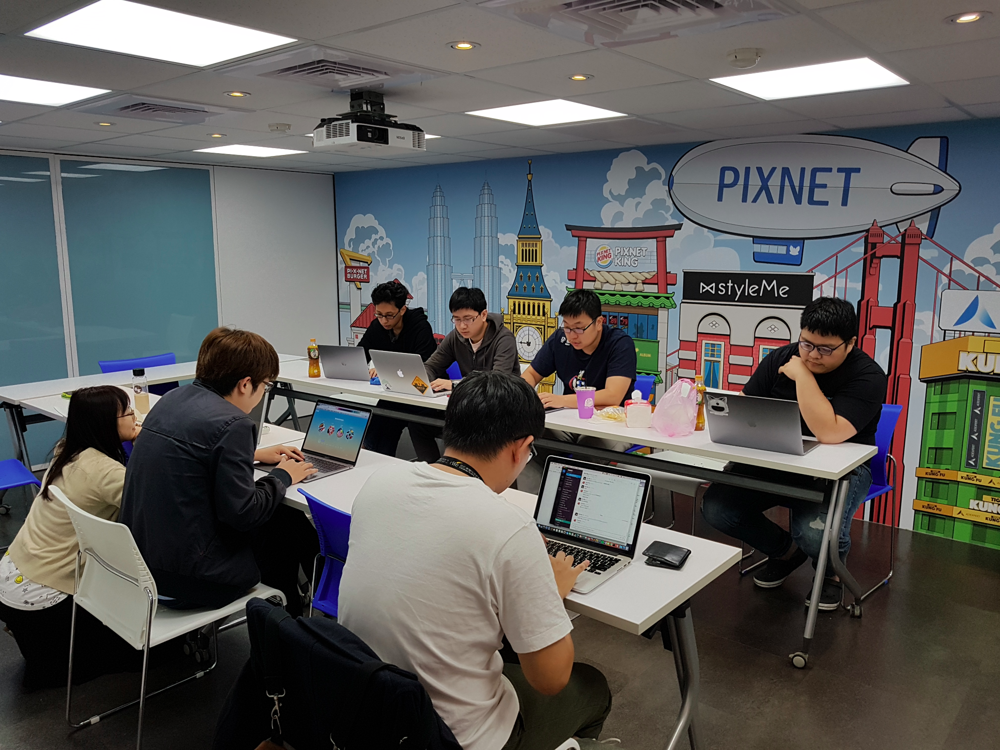

In [189]:
test_path = os.path.join(train_dir, 'test_img/image_qq.png')
img_arry = readImg([test_path], [1], is_aug=True)
img_arry2 = np.array(img_arry[0])
img_nor = preprocess_input(img_arry2.astype(np.float32))
vgg_result = model.predict(img_nor, verbose=0)
Image(test_path)

In [190]:
def predict(vgg_result):
    predict_score = [_model.predict(vgg_result, verbose=0)[0][0] for _model in model_list]
    for name, index in m.items():    # for name, age in list.items():  (for Python 3.x)
        if index == predict_score.index(min(predict_score)):
            print (name,index)
    print(predict_score)
    return predict_score
predict_score = predict(vgg_result)

food_env 2
[0.99988949, 0.99998522, 0.0023536]
